### **Libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### **1. Load Raw House Data & Overview**

In [ ]:
# path to the csv file
data_path =  '/content/drive/MyDrive/House_EDA_Project/Copy of raw_house_data.csv'

# Read the CSV file into DataFrame
df = pd.read_csv(data_path)

df


,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,kitchen_features,fireplaces,floor_covering,HOA
0,21530491,5300000.0,85637,-110.378200,31.356362,2154.00,5272.00,1941,13,10.0,10500.0,0.0,"Dishwasher, Freezer, Refrigerator, Oven",6,"Mexican Tile, Wood",0
1,21529082,4200000.0,85646,-111.045371,31.594213,1707.00,10422.36,1997,2,2.0,7300.0,0.0,"Dishwasher, Garbage Disposal",5,"Natural Stone, Other",0
2,3054672,4200000.0,85646,-111.040707,31.594844,1707.00,10482.00,1997,2,3.0,NaN,NaN,"Dishwasher, Garbage Disposal, Refrigerator",5,"Natural Stone, Other: Rock",NaN
3,21919321,4500000.0,85646,-111.035925,31.645878,636.67,8418.58,1930,7,5.0,9019.0,4.0,"Dishwasher, Double Sink, Pantry: Butler, Refri...",4,"Ceramic Tile, Laminate, Wood",NaN
4,21306357,3411450.0,85750,-110.813768,32.285162,3.21,15393.00,1995,4,6.0,6396.0,3.0,"Dishwasher, Garbage Disposal, Refrigerator, Mi...",5,"Carpet, Concrete",55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,21810382,495000.0,85641,-110.661829,31.907917,4.98,2017.00,2005,5,3.0,3601.0,3.0,"Dishwasher, Double Sink, Garbage Disposal, Gas...",1,"Carpet, Ceramic Tile",NaN
4996,21908591,550000.0,85750,-110.858556,32.316373,1.42,4822.01,1990,4,3.0,2318.0,3.0,"Dishwasher, Double Sink, Electric Range, Garba...",1,"Carpet, Ceramic Tile",43
4997,21832452,475000.0,85192,-110.755428,32.964708,12.06,1000.00,1969,3,2.0,1772.0,0.0,"Dishwasher, Electric Range, Island, Refrigerat...",0,Ceramic Tile,NaN
4998,21900515,550000.0,85745,-111.055528,32.296871,1.01,5822.93,2009,4,4.0,3724.0,3.0,"Dishwasher, Double Sink, Garbage Disposal, Gas...",1,"Carpet, Ceramic Tile",NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MLS               5000 non-null   int64  
 1   sold_price        5000 non-null   float64
 2   zipcode           5000 non-null   int64  
 3   longitude         5000 non-null   float64
 4   latitude          5000 non-null   float64
 5   lot_acres         4990 non-null   float64
 6   taxes             5000 non-null   float64
 7   year_built        5000 non-null   int64  
 8   bedrooms          5000 non-null   int64  
 9   bathrooms         4994 non-null   float64
 10  sqrt_ft           4944 non-null   float64
 11  garage            4993 non-null   float64
 12  kitchen_features  4967 non-null   object 
 13  fireplaces        5000 non-null   object 
 14  floor_covering    4999 non-null   object 
 15  HOA               4438 non-null   object 
dtypes: float64(8), int64(4), object(4)
memory 

In [ ]:
df.describe()

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage
count,5.000000e+03,5.000000e+03,5000.000000,5000.000000,5000.000000,4990.000000,5.000000e+03,5000.00000,5000.000000,4994.000000,4944.000000,4993.000000
mean,2.127070e+07,7.746262e+05,85723.025600,-110.912107,32.308512,4.661317,9.402828e+03,1992.32800,3.933800,3.829896,3716.366828,2.816143
std,2.398508e+06,3.185556e+05,38.061712,0.120629,0.178028,51.685230,1.729385e+05,65.48614,1.245362,1.387063,1120.683515,1.192946
min,3.042851e+06,1.690000e+05,85118.000000,-112.520168,31.356362,0.000000,0.000000e+00,0.00000,1.000000,1.000000,1100.000000,0.000000
25%,2.140718e+07,5.850000e+05,85718.000000,-110.979260,32.277484,0.580000,4.803605e+03,1987.00000,3.000000,3.000000,3047.000000,2.000000
50%,2.161469e+07,6.750000e+05,85737.000000,-110.923420,32.318517,0.990000,6.223760e+03,1999.00000,4.000000,4.000000,3512.000000,3.000000
75%,2.180480e+07,8.350000e+05,85749.000000,-110.859078,32.394334,1.757500,8.082830e+03,2006.00000,4.000000,4.000000,4130.250000,3.000000
max,2.192856e+07,5.300000e+06,86323.000000,-109.454637,34.927884,2154.000000,1.221508e+07,2019.00000,36.000000,36.000000,22408.000000,30.000000


**Check & Handle Missing Values**

In [ ]:
# Count zeros in numeric columns
zero_counts = (df[['lot_acres', 'taxes', 'year_built']] == 0).sum()
zero_counts

,0
lot_acres,35
taxes,22
year_built,5


In [ ]:
# Replace zeros with NaN for suspicious columns
cols_with_suspicious_zeros = ['lot_acres', 'taxes', 'year_built']
df[cols_with_suspicious_zeros] = df[cols_with_suspicious_zeros].replace(0, np.nan)

# Check how many NaNs now
df[cols_with_suspicious_zeros].isnull().sum()

,0
lot_acres,45
taxes,22
year_built,5


In [ ]:
# Count missing values per column
missing_values = df.isnull().sum()

# Display columns with missing values
print(missing_values[missing_values > 0])

lot_acres            45
taxes                22
year_built            5
bathrooms             6
sqrt_ft              56
garage                7
kitchen_features     33
floor_covering        1
HOA                 562
dtype: int64


In [ ]:
# Fill numerical columns with median (robust to outliers)
df['lot_acres'] = df['lot_acres'].fillna(df['lot_acres'].median())
df['taxes'] = df['taxes'].fillna(df['taxes'].median())
df['bathrooms'] = df['bathrooms'].fillna(df['bathrooms'].median())
df['sqrt_ft'] = df['sqrt_ft'].fillna(df['sqrt_ft'].median())
df['garage'] = df['garage'].fillna(df['garage'].median())
df['year_built'] = df['year_built'].fillna(df['year_built'].median())

In [ ]:
# Fill categorical columns
df['kitchen_features'] = df['kitchen_features'].fillna('Unknown')
df['floor_covering'] = df['floor_covering'].fillna('unknown')

In [ ]:
# Convert fireplaces to numeric safely
df['fireplaces'] = pd.to_numeric(df['fireplaces'], errors='coerce').fillna(0)

In [ ]:
# Drop HOA column
df = df.drop('HOA', axis=1)

**Check & Remove Dublicates**

In [ ]:
# check how many duplicates exist
dups = df.duplicated().sum()
print('Number of dups:', dups)

Number of dups: 0


In [ ]:
# Total number of rows
total_rows = len(df)

# Number of unique values in the MLS column
unique_mls = df['MLS'].nunique()

print(f"Total rows: {total_rows}")
print(f"Unique MLS values: {unique_mls}")

if total_rows == unique_mls:
    print("✅ All MLS values are unique, no duplicates.")
else:
    print(f"⚠️ There are {total_rows - unique_mls} duplicate MLS values.")

Total rows: 5000
Unique MLS values: 5000
✅ All MLS values are unique, no duplicates.


**Feature Engineering**

In [ ]:
df.describe()

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,fireplaces
count,5.000000e+03,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2.127070e+07,7.746262e+05,85723.025600,-110.912107,32.308512,4.660904,9.430298e+03,1994.327000,3.933800,3.830100,3714.077920,2.816400,1.875800
std,2.398508e+06,3.185556e+05,38.061712,0.120629,0.178028,51.633210,1.729375e+05,17.728997,1.245362,1.386243,1114.596305,1.192131,1.141506
min,3.042851e+06,1.690000e+05,85118.000000,-112.520168,31.356362,0.020000,1.000000e+00,1893.000000,1.000000,1.000000,1100.000000,0.000000,0.000000
25%,2.140718e+07,5.850000e+05,85718.000000,-110.979260,32.277484,0.600000,4.829135e+03,1987.000000,3.000000,3.000000,3051.000000,2.000000,1.000000
50%,2.161469e+07,6.750000e+05,85737.000000,-110.923420,32.318517,0.990000,6.243165e+03,1999.000000,4.000000,4.000000,3512.000000,3.000000,2.000000
75%,2.180480e+07,8.350000e+05,85749.000000,-110.859078,32.394334,1.750000,8.082830e+03,2006.000000,4.000000,4.000000,4120.000000,3.000000,3.000000
max,2.192856e+07,5.300000e+06,86323.000000,-109.454637,34.927884,2154.000000,1.221508e+07,2019.000000,36.000000,36.000000,22408.000000,30.000000,9.000000


In [ ]:
# Total rooms (bedrooms + bathrooms)
df['rooms'] = df['bedrooms'] + df['bathrooms'] # avoids multicollinearity

# Price per square foot
df['price_per_sqft'] = df['sold_price'] / df['sqrt_ft']  # price by size

# Luxury flag (1 if price_per_sqft in top 25%)
df['is_luxury'] = (df['price_per_sqft'] > df['price_per_sqft'].quantile(0.75)).astype(int) # traget-related flag for luxury houses

# ----------------------------
# Step 5: Normalize Latitude / Longitude
# ----------------------------
df['latitude_norm'] = (df['latitude'] - df['latitude'].min()) / (df['latitude'].max() - df['latitude'].min())    # good for regression/KNN
df['longitude_norm'] = (df['longitude'] - df['longitude'].min()) / (df['longitude'].max() - df['longitude'].min())

In [ ]:
print(df['kitchen_features'].value_counts())
print(df['floor_covering'].value_counts())
print(df['fireplaces'].value_counts())

kitchen_features
Dishwasher, Garbage Disposal, Refrigerator, Microwave, Oven                                                                                                                                   1719
Dishwasher, Garbage Disposal, Microwave, Oven                                                                                                                                                  270
Compactor, Dishwasher, Garbage Disposal, Refrigerator, Microwave, Oven                                                                                                                         189
Dishwasher, Garbage Disposal, Refrigerator, Oven                                                                                                                                               181
Dishwasher, Freezer, Garbage Disposal, Refrigerator, Microwave, Oven                                                                                                                           127
        

In [ ]:
if 'floor_covering' in df.columns:
    df['floor_covering_count'] = df['floor_covering'].fillna('Unknown').apply(lambda x: len(str(x).split(',')))
else:
    df['floor_covering_count'] = 0


# Create kitchen_feat_count column & floor_covering_count Column
if 'kitchen_features' in df.columns:
    df['kitchen_feat_count'] = df['kitchen_features'].fillna('Unknown').apply(
        lambda x: len(str(x).split(',')))
else:
    df['kitchen_feat_count'] = 0

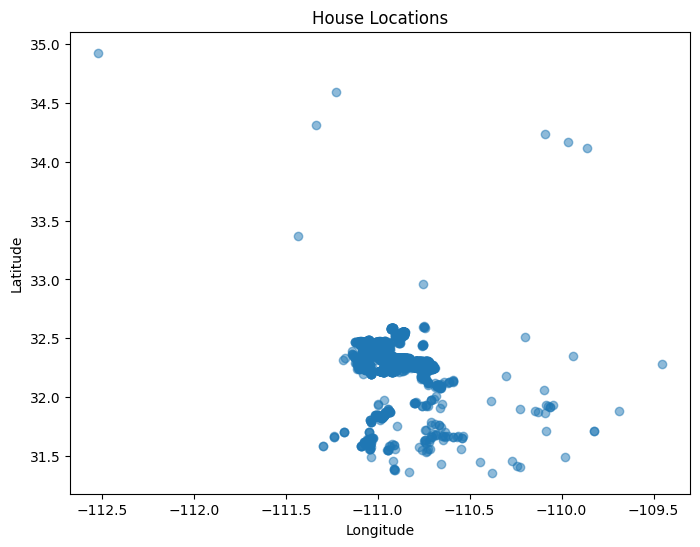

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
plt.scatter(df['longitude'], df['latitude'], alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('House Locations')
plt.show()

In [ ]:
df

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,...,kitchen_features,fireplaces,floor_covering,rooms,price_per_sqft,is_luxury,latitude_norm,longitude_norm,floor_covering_count,kitchen_feat_count
0,21530491,5300000.0,85637,-110.378200,31.356362,2154.00,5272.00,1941.0,13,10.0,...,"Dishwasher, Freezer, Refrigerator, Oven",6.0,"Mexican Tile, Wood",23.0,504.761905,1,0.000000,0.698727,2,4
1,21529082,4200000.0,85646,-111.045371,31.594213,1707.00,10422.36,1997.0,2,2.0,...,"Dishwasher, Garbage Disposal",5.0,"Natural Stone, Other",4.0,575.342466,1,0.066597,0.481090,2,2
2,3054672,4200000.0,85646,-111.040707,31.594844,1707.00,10482.00,1997.0,2,3.0,...,"Dishwasher, Garbage Disposal, Refrigerator",5.0,"Natural Stone, Other: Rock",5.0,1195.899772,1,0.066773,0.482612,2,3
3,21919321,4500000.0,85646,-111.035925,31.645878,636.67,8418.58,1930.0,7,5.0,...,"Dishwasher, Double Sink, Pantry: Butler, Refri...",4.0,"Ceramic Tile, Laminate, Wood",12.0,498.946668,1,0.081062,0.484172,3,4
4,21306357,3411450.0,85750,-110.813768,32.285162,3.21,15393.00,1995.0,4,6.0,...,"Dishwasher, Garbage Disposal, Refrigerator, Mi...",5.0,"Carpet, Concrete",10.0,533.372420,1,0.260057,0.556641,2,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,21810382,495000.0,85641,-110.661829,31.907917,4.98,2017.00,2005.0,5,3.0,...,"Dishwasher, Double Sink, Garbage Disposal, Gas...",1.0,"Carpet, Ceramic Tile",8.0,137.461816,0,0.154431,0.606205,2,9
4996,21908591,550000.0,85750,-110.858556,32.316373,1.42,4822.01,1990.0,4,3.0,...,"Dishwasher, Double Sink, Electric Range, Garba...",1.0,"Carpet, Ceramic Tile",7.0,237.273512,1,0.268796,0.542031,2,10
4997,21832452,475000.0,85192,-110.755428,32.964708,12.06,1000.00,1969.0,3,2.0,...,"Dishwasher, Electric Range, Island, Refrigerat...",0.0,Ceramic Tile,5.0,268.058691,1,0.450325,0.575672,1,6
4998,21900515,550000.0,85745,-111.055528,32.296871,1.01,5822.93,2009.0,4,4.0,...,"Dishwasher, Double Sink, Garbage Disposal, Gas...",1.0,"Carpet, Ceramic Tile",8.0,147.690655,0,0.263336,0.477777,2,9


In [ ]:
df.describe()

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,fireplaces,rooms,price_per_sqft,is_luxury,latitude_norm,longitude_norm,floor_covering_count,kitchen_feat_count
count,5.000000e+03,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2.127070e+07,7.746262e+05,85723.025600,-110.912107,32.308512,4.660904,9.430298e+03,1994.327000,3.933800,3.830100,3714.077920,2.816400,1.875800,7.76390,212.304835,0.249600,0.266595,0.524562,2.163600,6.520200
std,2.398508e+06,3.185556e+05,38.061712,0.120629,0.178028,51.633210,1.729375e+05,17.728997,1.245362,1.386243,1114.596305,1.192131,1.141506,2.41739,67.959038,0.432825,0.049847,0.039350,0.763251,3.020897
min,3.042851e+06,1.690000e+05,85118.000000,-112.520168,31.356362,0.020000,1.000000e+00,1893.000000,1.000000,1.000000,1100.000000,0.000000,0.000000,2.00000,24.544805,0.000000,0.000000,0.000000,1.000000,1.000000
25%,2.140718e+07,5.850000e+05,85718.000000,-110.979260,32.277484,0.600000,4.829135e+03,1987.000000,3.000000,3.000000,3051.000000,2.000000,1.000000,7.00000,175.197997,0.000000,0.257907,0.502656,2.000000,5.000000
50%,2.161469e+07,6.750000e+05,85737.000000,-110.923420,32.318517,0.990000,6.243165e+03,1999.000000,4.000000,4.000000,3512.000000,3.000000,2.000000,7.00000,202.096766,0.000000,0.269396,0.520871,2.000000,5.000000
75%,2.180480e+07,8.350000e+05,85749.000000,-110.859078,32.394334,1.750000,8.082830e+03,2006.000000,4.000000,4.000000,4120.000000,3.000000,3.000000,9.00000,233.644860,0.000000,0.290624,0.541860,3.000000,9.000000
max,2.192856e+07,5.300000e+06,86323.000000,-109.454637,34.927884,2154.000000,1.221508e+07,2019.000000,36.000000,36.000000,22408.000000,30.000000,9.000000,71.00000,1208.333333,1.000000,1.000000,1.000000,6.000000,15.000000


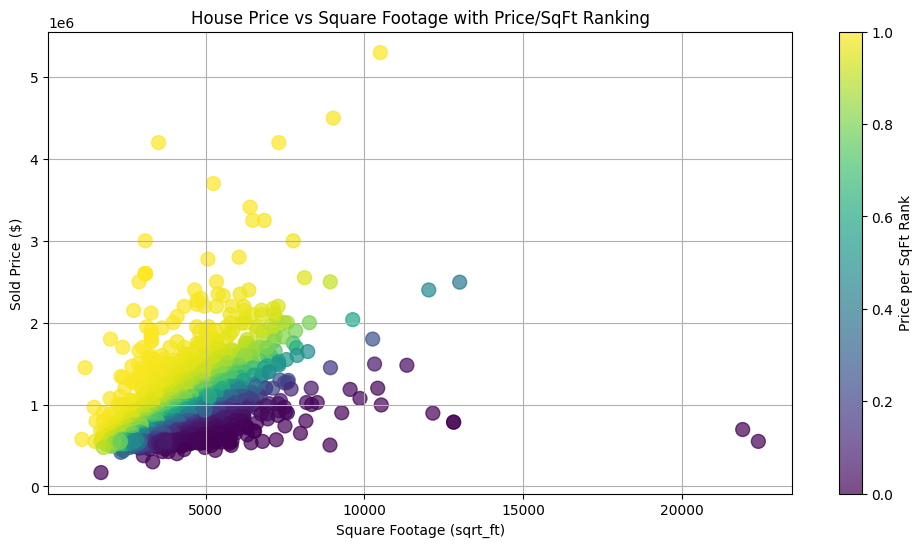

In [ ]:
# Rank price_per_sqft for coloring
df['price_per_sqft_rank'] = df['price_per_sqft'].rank()

# Normalize rank for colormap
norm = plt.Normalize(df['price_per_sqft_rank'].min(), df['price_per_sqft_rank'].max())
colors = plt.cm.viridis(norm(df['price_per_sqft_rank']))

# Create scatter plot
plt.figure(figsize=(12, 6))
scatter = plt.scatter(df['sqrt_ft'], df['sold_price'], c=colors, s=100, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Price per SqFt Rank')

# Labels and title
plt.xlabel('Square Footage (sqrt_ft)')
plt.ylabel('Sold Price ($)')
plt.title('House Price vs Square Footage with Price/SqFt Ranking')
plt.grid(True)
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import folium
# ----------------------------

# Step 1: Compute price per sqft if not already
df['price_per_sqft'] = df['sold_price'] / df['sqrt_ft']

# ----------------------------
# Step 2: Cluster regions geographically
# ----------------------------
coords = df[['latitude', 'longitude']].values
k = 12  # number of regions
kmeans = KMeans(n_clusters=k, random_state=42)
df['region_label'] = kmeans.fit_predict(coords)

# ----------------------------
# Step 3: Within each region, categorize houses by price_per_sqft
# ----------------------------
def price_category(group):
    quantiles = group['price_per_sqft'].quantile([0.33, 0.66])
    def categorize(x):
        if x <= quantiles.iloc[0]:
            return 'Low'
        elif x <= quantiles.iloc[1]:
            return 'Medium'
        else:
            return 'High'
    return group['price_per_sqft'].apply(categorize)

df['price_category'] = df.groupby('region_label', group_keys=False).apply(price_category)

# ----------------------------
# Step 4: Assign colors for visualization
# ----------------------------
region_colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
                 'cadetblue', 'darkgreen', 'pink', 'lightblue', 'yellow', 'brown']
price_colors = {'Low': 0.4, 'Medium': 0.6, 'High': 0.9}  # fill opacity

# ----------------------------
# Step 5: Initialize map
# ----------------------------
map_center = [df['latitude'].mean(), df['longitude'].mean()]
house_map = folium.Map(location=map_center, zoom_start=12)

# ----------------------------
# Step 6: Add houses to map with region color and price opacity
# ----------------------------
for _, row in df.iterrows():
    popup_text = f"""
    MLS: {row['MLS']}<br>
    Price: ${row['sold_price']:,.0f}<br>
    Bedrooms: {row['bedrooms']}<br>
    Bathrooms: {row['bathrooms']}<br>
    SqFt: {row['sqrt_ft']}<br>
    Price/SqFt: ${row['price_per_sqft']:.2f}<br>
    Region: {row['region_label']}<br>
    Price Category: {row['price_category']}
    """

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=region_colors[row['region_label'] % len(region_colors)],
        fill=True,
        fill_color=region_colors[row['region_label'] % len(region_colors)],
        fill_opacity=price_colors[row['price_category']],
        popup=folium.Popup(popup_text, max_width=300)
    ).add_to(house_map)

# ----------------------------
# Step 7: Display map
# ----------------------------
house_map

/tmp/ipython-input-2308024868.py:32: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df['price_category'] = df.groupby('region_label', group_keys=False).apply(price_category)


In [ ]:
df.columns

Index(['MLS', 'sold_price', 'zipcode', 'longitude', 'latitude', 'lot_acres',
       'taxes', 'year_built', 'bedrooms', 'bathrooms', 'sqrt_ft', 'garage',
       'kitchen_features', 'fireplaces', 'floor_covering', 'rooms',
       'price_per_sqft', 'is_luxury', 'latitude_norm', 'longitude_norm',
       'floor_covering_count', 'kitchen_feat_count', 'price_per_sqft_rank',
       'region_label', 'price_category'],
      dtype='object')

# Price-per-sqft Category

In [ ]:
# Create price_per_sqft category

# Assign a category to each house based on price per square foot

# Compute price per sqft category (e.g., fixed width 50)
def price_cat_func(x, width=50):
    return int(x // width)

df['price_cat'] = df['price_per_sqft'].apply(price_cat_func)


####
 • Each house now has a price category based on price_per_sqft.

 • Later we will use this as the target for KNN prediction.

# Visualize Price Categories on Map

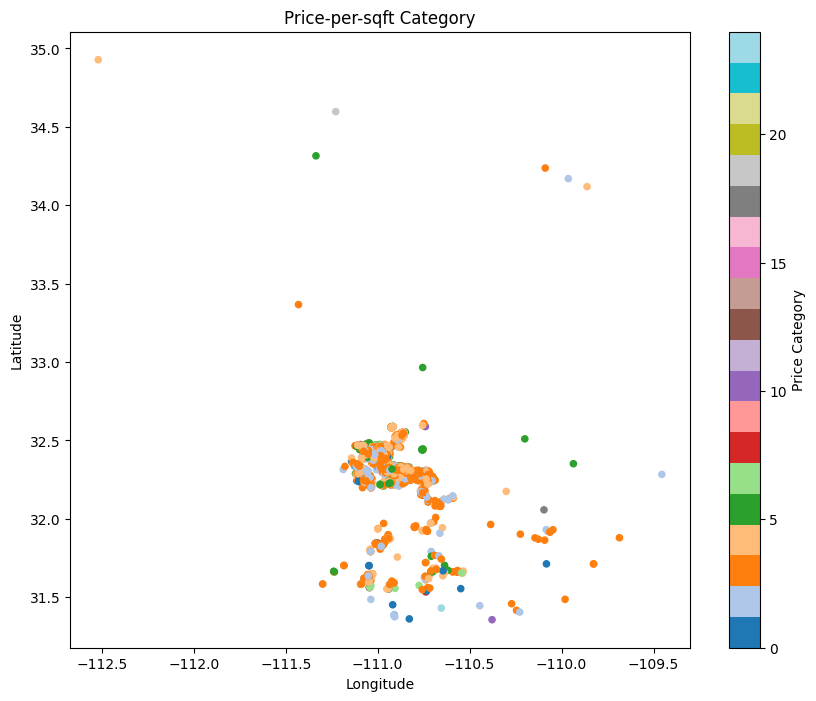

In [ ]:
# Visualize price categories

plt.figure(figsize=(10,8))
scatter = plt.scatter(df['longitude'], df['latitude'], c=df['price_cat'], cmap='tab20', s=20)
plt.colorbar(scatter, label='Price Category')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Price-per-sqft Category')
plt.show()

####
 • Each color now represents a price category.

 • This helps to see the distribution of high vs low price per sqft areas.

# KNN Function for Price Category Prediction

In [ ]:
# KNNClassifier

class KNNClassifier:
    def fit(self, X, y):
        # X: (N,2) array with [latitude, longitude]
        # y: integer categories (price bins)
        self.X = X.copy()
        self.y = y.copy().astype(int)

    def predict(self, X, K=10, epsilon=1e-3):
        # X: (M,2) array of queries (lat, lon)
        N = len(X)
        y_hat = np.zeros(N, dtype=int)

        for i in range(N):
            dist2 = np.sum((self.X - X[i])**2, axis=1)   # squared Euclidean distance
            idxt = np.argsort(dist2)[:K]                 # indices of K nearest neighbors
            # weight by inverse-distance (stabilized)
            gamma_k = 1.0 / (np.sqrt(dist2[idxt] + epsilon))

            # bincount with weights -> returns index of category with max weighted votes
            y_hat[i] = np.bincount(self.y[idxt], weights=gamma_k).argmax()

        return y_hat

####
 • X_knn contains latitude and longitude.

 • y_knn contains price categories.

 • predict returns integer categories by weighted majority vote from K neighbours.

# Test KNN Prediction
####
 • Define a sample house with latitude, longitude, and price per sqft.

 • This is used to test price category assignment.

In [ ]:
# Sample house for testing price category prediction

# Sample house data
sample_house = {
    'latitude': 32.22,
    'longitude': -110.78,
    'price_per_sqft': 200
}

# Function to assign price category
def price_sq(X):
    return int(X // 50)  # same bin width as before

sample_house['predicted_cat'] = price_sq(sample_house['price_per_sqft'])

print("Sample House Data:")
print(f"Latitude: {sample_house['latitude']}")
print(f"Longitude: {sample_house['longitude']}")
print(f"Price per sqft: {sample_house['price_per_sqft']}")
print(f"Predicted price category (cat): {sample_house['predicted_cat']}")

Sample House Data:
Latitude: 32.22
Longitude: -110.78
Price per sqft: 200
Predicted price category (cat): 4


#### #
 • Function price_sq computes the price category by binning price per sqft.

 • Apply the function to the sample house to get predicted price category.

 • Output shows the latitude, longitude, price per sqft, and predicted category.

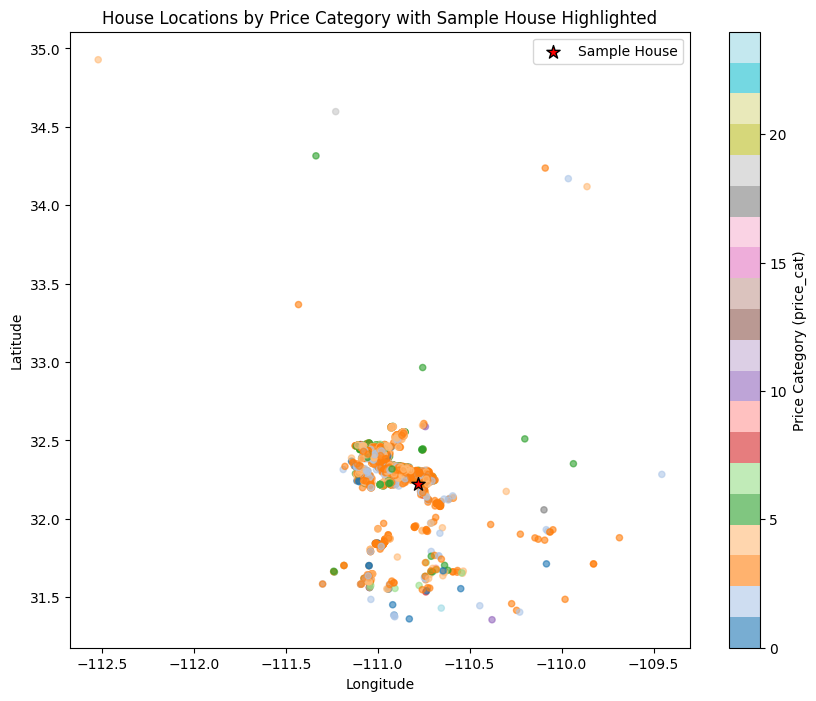

In [ ]:
# Visualize sample house and regions with price categories

# Show how a sample house falls into a price category on the map.


plt.figure(figsize=(10,8))

# Scatter plot of all houses colored by price category
scatter = plt.scatter(df['longitude'], df['latitude'], c=df['price_cat'], cmap='tab20', s=20, alpha=0.6)
plt.colorbar(scatter, label='Price Category (price_cat)')

# Highlight the sample house
plt.scatter(sample_house['longitude'], sample_house['latitude'],
            color='red', edgecolor='black', s=100, marker='*', label='Sample House')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('House Locations by Price Category with Sample House Highlighted')
plt.legend()
plt.show()

### Prepare KNN inputs

In [ ]:
# Prepare X (lat, lon) and y (price category)
X_knn = df[['latitude', 'longitude']].to_numpy()
y_knn = df['price_cat'].to_numpy().astype(int)

print("Prepared KNN inputs:", X_knn.shape, y_knn.shape)
print("Example price_cat counts:")
print(pd.Series(y_knn).value_counts().sort_index().head(20))

Prepared KNN inputs: (5000, 2) (5000,)
Example price_cat counts:
0        2
1       25
2      399
3     1944
4     1758
5      584
6      147
7       51
8       26
9       24
10      17
11       8
12       2
13       1
14       2
15       1
16       4
17       1
18       1
19       1
Name: count, dtype: int64


### Fit Knn on the dataset & assign region_knn to every house

In [ ]:
# Fit KNNClassifier and assign region labels
# Purpose: learn local price-based region labels and store in df['region_knn'].

knn_loc = KNNClassifier()
knn_loc.fit(X_knn, y_knn)

# Predict each house's "region" by voting among its K nearest price neighbors.
K_region = 10
df['region_knn'] = knn_loc.predict(X_knn, K=K_region)

print("Unique region_knn count:", df['region_knn'].nunique())
print("Sample region counts:\n", df['region_knn'].value_counts().head(10))

Unique region_knn count: 14
Sample region counts:
 region_knn
3     2299
4     2025
5      430
2      106
6       57
9       25
7       20
1       10
16       9
10       8
Name: count, dtype: int64


####Each house now has a region label that reflects local price neighborhood.

### Prepare features & interaction creation function

### MVLinearRegression class

In [ ]:
# MVLinearRegression (gradient descent)
# Purpose: train linear regression with gradient descent.

class MVLinearRegression:
    def __init__(self):
        self.W = None
        self.J = None

    def fit(self, X, y, eta=1e-2, epochs=2000, show_curve=False):
        """
        X: (N, D) design matrix (including bias column)
        y: (N,) target
        """
        N, D = X.shape
        # Initialize weights small random
        self.W = np.random.randn(D) * 0.01
        self.J = np.zeros(int(epochs))

        for epoch in range(int(epochs)):
            y_hat = X @ self.W
            # OLS loss
            self.J[epoch] = (1.0 / (2 * N)) * np.sum((y - y_hat) ** 2)
            # gradient
            grad = (1.0 / N) * (X.T @ (y_hat - y))
            # weight update
            self.W -= eta * grad

        if show_curve:
            import matplotlib.pyplot as plt
            plt.figure()
            plt.plot(self.J)
            plt.xlabel('Epoch')
            plt.ylabel('Cost J')
            plt.title('Training curve')
            plt.show()

    def predict(self, X):
        return X @ self.W

#### classic gradient-descent linear regression. fit expects X already to include a bias (column of ones) — we’ll add bias later.

### Evaluation Metrics

In [ ]:
# Evaluation metrics
def MSE(y_true, y_hat):
    return np.mean((y_true - y_hat) ** 2)

def MAE(y_true, y_hat):
    return np.mean(np.abs(y_true - y_hat))

def R2(y_true, y_hat):
    ss_res = np.sum((y_true - y_hat) ** 2)
    ss_tot = np.sum((y_true - np.mean(y_true)) ** 2)
    return 1 - ss_res / ss_tot

### Select Bsic Feature

In [ ]:
basic_features = [
    'rooms',
    'garage',
    'year_built',
    'sqrt_ft',
    'floor_covering_count',
    'kitchen_feat_count',
    'fireplaces',
    'region_knn'
]

X = df[basic_features].to_numpy()
y = df['sold_price'].to_numpy()

### Shuffle & Split Data into Train/Test

In [ ]:
np.random.seed(42)
indices = np.random.permutation(len(X))

X = X[indices]
y = y[indices]

split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

### Scaling(Train State Only)

In [ ]:
mu = X_train.mean(axis=0)
sigma = X_train.std(axis=0) + 1e-8

X_train_scaled = (X_train - mu) / sigma
X_test_scaled  = (X_test - mu) / sigma

### Add Bias Column

In [ ]:
X_train_b = np.hstack([np.ones((X_train_scaled.shape[0], 1)), X_train_scaled])
X_test_b  = np.hstack([np.ones((X_test_scaled.shape[0], 1)), X_test_scaled])

### Train Basic Model

In [ ]:
model_basic = MVLinearRegression()
model_basic.fit(X_train_b, y_train, eta=1e-2, epochs=2000)

### Evaluate Basic Model

In [ ]:
def evaluate(model, X_train, y_train, X_test, y_test):

    y_pred_train = model.predict(X_train)
    y_pred_test  = model.predict(X_test)

    mse_train = np.mean((y_train - y_pred_train)**2)
    mae_train = np.mean(np.abs(y_train - y_pred_train))
    r2_train  = 1 - mse_train / np.var(y_train)

    mse_test = np.mean((y_test - y_pred_test)**2)
    mae_test = np.mean(np.abs(y_test - y_pred_test))
    r2_test  = 1 - mse_test / np.var(y_test)

    print(f"Train — MSE: {mse_train:,.2f}, MAE: {mae_train:,.2f}, R2: {r2_train:.4f}")
    print(f"Test  — MSE: {mse_test:,.2f}, MAE: {mae_test:,.2f}, R2: {r2_test:.4f}")

evaluate(model_basic, X_train_b, y_train, X_test_b, y_test)

Train — MSE: 47,490,395,845.99, MAE: 126,525.97, R2: 0.5332
Test  — MSE: 57,411,930,499.31, MAE: 123,350.09, R2: 0.4268


### Simple Model Performance

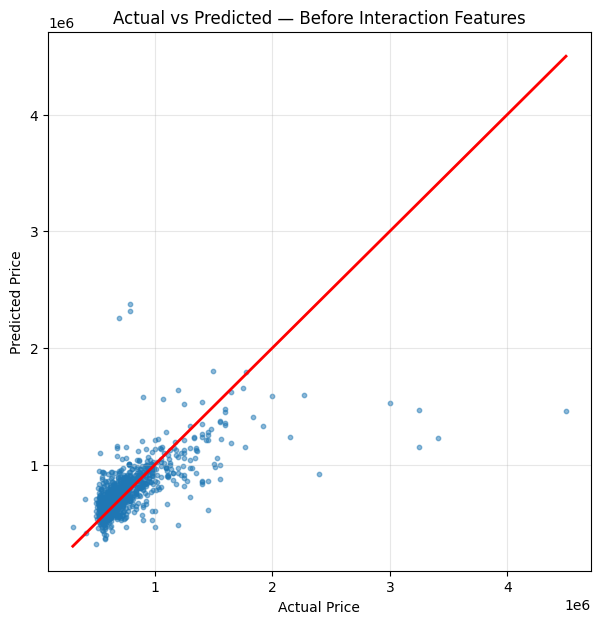

In [ ]:
# Predictions
y_train_pred_basic = model_basic.predict(X_train_b)
y_test_pred_basic  = model_basic.predict(X_test_b)

# Plot
plt.figure(figsize=(7,7))
plt.scatter(y_test, y_test_pred_basic, s=10, alpha=0.5)
plt.plot([y_test.min(), y_test.max()],
         [y_test.min(), y_test.max()],
         color = 'red', linewidth=2)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Actual vs Predicted — Before Interaction Features")
plt.grid(alpha=0.3)
plt.show()

### Create Interaction Features

In [ ]:
# Base features
base_feats = ['rooms', 'garage', 'year_built', 'sqrt_ft',
              'floor_covering_count', 'kitchen_feat_count', 'fireplaces', 'region_knn']

X_base = df[base_feats].to_numpy()
y_base = df['sold_price'].to_numpy()

# Create a copy for interaction model
X_int = df[base_feats].copy()

# Add interaction terms
X_int['rooms_x_kitchen'] = df['rooms'] * df['kitchen_feat_count']
X_int['sqft_x_fireplaces'] = df['sqrt_ft'] * df['fireplaces']
X_int['rooms_x_floor'] = df['rooms'] * df['floor_covering_count']

# Convert to numpy
X_int = X_int.to_numpy()
y_int = y_base.copy()

### Repeat all steps with interction dataset

In [ ]:
np.random.seed(42)
indices_int = np.random.permutation(len(X_int))

X_int = X_int[indices_int]
y_int = y_int[indices_int]

In [ ]:
split_int = int(0.8 * len(X_int))

X_train_int = X_int[:split_int]
X_test_int  = X_int[split_int:]

y_train_int = y_int[:split_int]
y_test_int  = y_int[split_int:]

In [ ]:
mu_int = X_train_int.mean(axis=0)
sigma_int = X_train_int.std(axis=0) + 1e-8

X_train_int_scaled = (X_train_int - mu_int) / sigma_int
X_test_int_scaled  = (X_test_int  - mu_int) / sigma_int

In [ ]:
X_train_int_b = np.hstack([np.ones((X_train_int_scaled.shape[0], 1)),
                           X_train_int_scaled])

X_test_int_b = np.hstack([np.ones((X_test_int_scaled.shape[0], 1)),
                          X_test_int_scaled])

In [ ]:
model_inter = MVLinearRegression()
model_inter.fit(X_train_int_b, y_train_int, eta=1e-2, epochs=2000)

In [ ]:
evaluate(model_inter, X_train_int_b, y_train_int, X_test_int_b, y_test_int)

Train — MSE: 45,134,654,774.56, MAE: 123,073.40, R2: 0.5564
Test  — MSE: 55,598,656,146.89, MAE: 119,651.61, R2: 0.4449


### Model with Interaction Performance

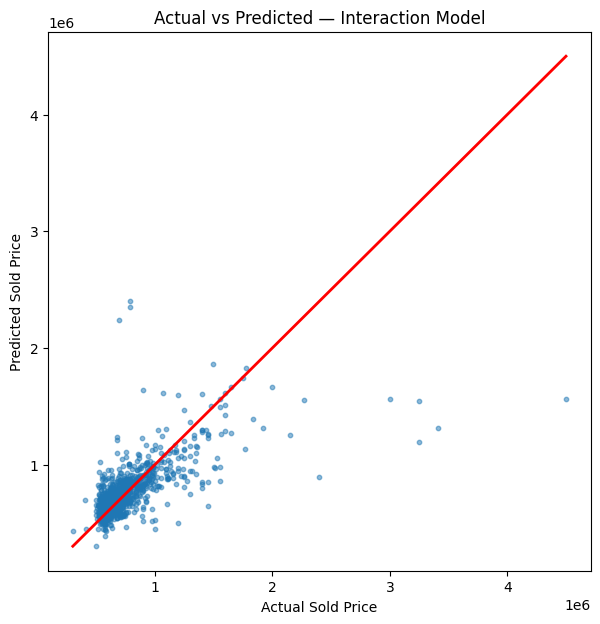

In [ ]:
# Predictions
y_train_pred_int = model_inter.predict(X_train_int_b)
y_test_pred_int  = model_inter.predict(X_test_int_b)

plt.figure(figsize=(7,7))
plt.scatter(y_test_int, y_test_pred_int, s=10, alpha=0.5)
plt.plot([y_test_int.min(), y_test_int.max()],
         [y_test_int.min(), y_test_int.max()],
         color='red', linewidth=2)
plt.xlabel("Actual Sold Price")
plt.ylabel("Predicted Sold Price")
plt.title("Actual vs Predicted — Interaction Model")
plt.show()

### Predicting Price Category from Latitude & longitude

In [88]:
def get_price_category(lat, lon, knn_model, K=10):
    """
    Predict price_per_sqft category using the trained KNN model.
    lat, lon -> floats
    knn_model -> trained KNNClassifier (fit with X = [lat, lon], y = price_cat)
    """
    X_new = np.array([[lat, lon]])  # shape (1,2)
    pred_cat = knn_model.predict(X_new, K=K)[0]
    return pred_cat

#### Example

In [89]:
lat = 32.22
lon = -110.78

category = get_price_category(lat, lon, knn_loc)
print("Predicted Price Category:", category)

Predicted Price Category: 3


### House Prediction Function

In [93]:
# predicting final price & price per sqft

def predict_house_price(sample_house, model, mu_int, sigma_int):
    """
    Predict sold price and price per sqft for a new house.

    sample_house: dict with keys:
        'rooms', 'garage', 'year_built', 'sqft',
        'kitchen_feat', 'fireplaces', 'floor_cover',
        'latitude', 'longitude', 'region_knn' (optional, set 0 if unknown)
    model: trained MVLinearRegression model
    mu_int, sigma_int: mean and std used for scaling training data
    """

    # Prepare feature vector in the same order as training
    # Add region_knn as 0 if not available
    region_knn = sample_house.get('region_knn', 0)

    x = np.array([
        sample_house['rooms'],
        sample_house['garage'],
        sample_house['year_built'],
        sample_house['sqft'],
        sample_house['floor_cover'],
        sample_house['kitchen_feat'],
        sample_house['fireplaces'],
        region_knn,
        # interaction features
        sample_house['rooms'] * sample_house['kitchen_feat'],
        sample_house['sqft'] * sample_house['fireplaces'],
        sample_house['rooms'] * sample_house['floor_cover']
    ], dtype=float)

    # Scale
    x_scaled = (x - mu_int) / sigma_int

    # Add bias term
    x_input = np.hstack([1, x_scaled])

    # Predict price
    predicted_price = model.predict(x_input.reshape(1,-1))[0]

    # Compute price per sqft
    price_per_sqft = predicted_price / sample_house['sqft']

    return predicted_price, price_per_sqft



In [94]:
# Example usage
sample_house = {
    "rooms":5, "garage":2, "year_built":1977,
    "sqft":2477, "kitchen_feat":3,
    "fireplaces":1, "floor_cover":2,
    "latitude":32.326657, "longitude":-110.884043
}

pred_price, pred_price_sqft = predict_house_price(sample_house, model_inter, mu_int, sigma_int)
print("Predicted price:", round(pred_price,2))
print("Predicted price per sqft:", round(pred_price_sqft,2))

Predicted price: 111600.59
Predicted price per sqft: 45.05


In [96]:
# Example usage
sample_house = {
    "rooms":6, "garage":2, "year_built":1988,
    "sqft":3339, "kitchen_feat":5,
    "fireplaces":1, "floor_cover":1,
    "latitude":32.310077, "longitude":-110.93
}

pred_price, pred_price_sqft = predict_house_price(sample_house, model_inter, mu_int, sigma_int)
print("Predicted price:", round(pred_price,2))
print("Predicted price per sqft:", round(pred_price_sqft,2))

Predicted price: 238358.18
Predicted price per sqft: 71.39


#### Price Prediction Accuracy

In [97]:
# y_true: actual prices, y_pred: predicted prices
y_true = y_test_int  # actual sold prices
y_pred = model_inter.predict(X_test_int_b)  # predicted prices

mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
accuracy = 100 - mape  # approximate "accuracy" percentage

print("MAPE (%):", round(mape,2))
print("Approximate Accuracy (%):", round(accuracy,2))

MAPE (%): 14.51
Approximate Accuracy (%): 85.49
